In [1]:
# Initial Setup

train=True
Epochs=30
preload=False
hough=False
rams=False
dynAug=False
depth = 6
chan = 64
ir = 1.1
rand_sv = 42
ds = 'MIX'
zone = 'CUP'
cup = True
mix = True
dri = False
rim = False

In [2]:
# Import all the necessary libraries

import tensorflow as tf
import os
import glob
from datetime import datetime
import warnings
warnings.simplefilter('ignore')
import scipy as sp
import scipy.ndimage
import numpy as np
import pandas as pd
import skimage
import skimage.exposure
import skimage.transform
import skimage.measure
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
import h5py
from tqdm import tqdm_notebook
from IPython.display import display
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import layers as layers
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, BatchNormalization, Conv2D, MaxPooling2D, ZeroPadding2D, Input, Embedding, LSTM, Lambda, UpSampling2D, concatenate, Conv2DTranspose
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import SGD, Adam, Adagrad
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, ReduceLROnPlateau, CSVLogger
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import backend as K
from sklearn.model_selection import train_test_split
import math
from skimage.transform import hough_ellipse
from skimage.draw import ellipse_perimeter, ellipse
from skimage.measure import  ransac, EllipseModel

In [3]:
K.set_floatx('float32')

In [4]:
# Metrics for evaluation

def dice_coef(y_true, y_pred): # accuracy function 
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + K.epsilon()) / (K.sum(y_true_f) + K.sum(y_pred_f) + K.epsilon())
  
def dice_loss(y_true,y_pred): # loss function 
    return -dice_coef(y_true,y_pred)
  
def log_dice_loss(y_true, y_pred):
    return -K.log(dice_coef(y_true, y_pred))

# Computes mean Intersection-over-Union (IOU) for two arrays of binary images.

def iou_loss_core(y_true, y_pred, smooth=1):
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    union = K.sum(y_true,-1) + K.sum(y_pred,-1) - intersection
    iou = (intersection + smooth) / (union + smooth)
    return iou

In [5]:
# helper function to increase the brightness
# hue, saturation, value

def modify_brightness_p(img, p=1.2):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)

    lim = 1.0/p
    v[v > lim] = 1.0
    v[v <= lim] *= p

    final_hsv = cv2.merge((h, s, v))
    img = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR).clip(min=0)
    return img

In [6]:
# helper code to shuffle instead of random shuffle 

def unison_shuffled_copies(a, b):
    assert len(a) == len(b)
    p = np.random.permutation(len(a))
    return a[p], b[p]

In [7]:
# helper code to 512 image size indices with original images

def index512_resize(index,top):
    index=index*top/512
    return int(index)

In [8]:
#load the data

h5f2 = h5py.File(os.path.join(os.path.dirname(os.getcwd()), r'C:\Users\Ranjith ch\Desktop\code\glucoma\model\data', 'DRISHTI_GS.hdf5'), 'r')

In [9]:
# U-Net: Convolutional Networks for Biomedical Image Segmentation
# (https://arxiv.org/abs/1505.04597)

def conv_block(m, dim, acti, bn, res, do=0):
	n = Conv2D(dim, 3, activation=acti, padding='same')(m)
	n = BatchNormalization()(n) if bn else n
	n = Dropout(do)(n) if do else n
	n = Conv2D(dim, 3, activation=acti, padding='same')(n)
	n = BatchNormalization()(n) if bn else n
	return Concatenate()([m, n]) if res else n

def level_block(m, dim, depth, inc, acti, do, bn, mp, up, res):
	if depth > 0:
		n = conv_block(m, dim, acti, bn, res)
		m = MaxPooling2D()(n) if mp else Conv2D(dim, 3, strides=2, padding='same')(n)
		m = level_block(m, int(inc*dim), depth-1, inc, acti, do, bn, mp, up, res)
		if up:
			m = UpSampling2D()(m)
			m = Conv2D(dim, 2, activation=acti, padding='same')(m)
		else:
			m = Conv2DTranspose(dim, 3, strides=2, activation=acti, padding='same')(m)
		n = concatenate([n, m],axis=-1)
		m = conv_block(n, dim, acti, bn, res)
	else:
		m = conv_block(m, dim, acti, bn, res, do)
	return m

def UNet(img_shape, out_ch=1, start_ch=64, depth=4, inc_rate=2., activation='relu', 
		 dropout=0.5, batchnorm=False, maxpool=True, upconv=True, residual=False):
	i = Input(shape=img_shape)
	o = level_block(i, start_ch, depth, inc_rate, activation, dropout, batchnorm, maxpool, upconv, residual)
	o = Conv2D(out_ch, 1, activation='sigmoid')(o)
	return Model(inputs=i, outputs=o)

In [10]:
# image shape

img_shape=(128,128,3)

In [11]:
# DRISHTI Dataset
# step1: prepare the data for our model injection

Xori= np.asarray(h5f2['DRISHTI-GS/orig/images'])
disc_locations = np.asarray( h5f2['DRISHTI-GS/512 px/disc_locations'])
FC = np.asarray(h5f2['DRISHTI-GS/512 px/file_codes'] ) 
indDRI = np.arange(0,Xori.shape[0])
bsqside=np.maximum((disc_locations[:,3]-disc_locations[:,1]),(disc_locations[:,2]-disc_locations[:,0]))
isize=Xori.shape[1]

if (cup):
  
  Yf = np.asarray(h5f2['DRISHTI-GS/512 px/cup'])
 
  Xc = [Xori[i][index512_resize(disc_locations[i][0],isize):index512_resize(disc_locations[i][0]+bsqside[i],isize), index512_resize(disc_locations[i][1],isize):index512_resize(disc_locations[i][1]+bsqside[i],isize)] 
                   for i in range(len(Xori))]

  Yc=[Yf[i][disc_locations[i][0]:disc_locations[i][0]+bsqside[i], disc_locations[i][1]:disc_locations[i][1]+bsqside[i]] 
                   for i in range(len(Xori))]

else:
  Yf =np.asarray( h5f2['DRISHTI-GS/512 px/disc'])
  
  Xc = [Xori[i][index512_resize(50,isize):index512_resize(462,isize), index512_resize(50,isize):index512_resize(462,isize)] 
                   for i in range(len(Xori))]

  Yc=[Yf[i][50:462,50:462] 
                   for i in range(len(Xori))]

X=[cv2.resize(img, (128, 128),interpolation=cv2.INTER_NEAREST) for img in Xc]
X=np.asarray(X) 
am=np.amax(X)
X=X.astype(np.float32)/am 
print(np.amax(X),np.amin(X))

Y=[cv2.resize(img, (128, 128),interpolation=cv2.INTER_NEAREST)[..., None] for img in Yc]
Y=np.asarray(Y) 
ym=np.amax(Y) 
Yf=Y/ym
#get binary mask
Yb=(Y>0.5).astype(np.float32) 

print(np.amax(Yf),np.amin(Yf))
print(X.shape)

1.0 0.0
1.0 0.0
(50, 128, 128, 3)


In [12]:
disc_locations.shape

(50, 4)

In [15]:
X_test_dri.shape

(13, 128, 128, 3)

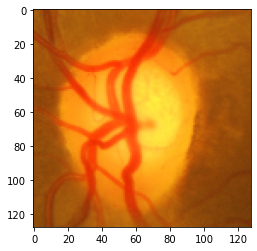

In [16]:
plt.imshow(X_test_dri[0])

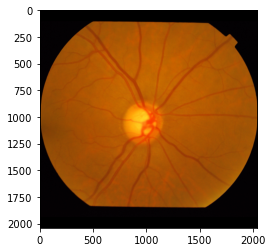

In [17]:
plt.imshow(Xori[15])

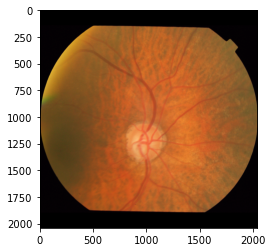

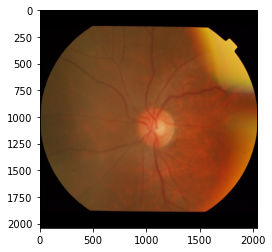

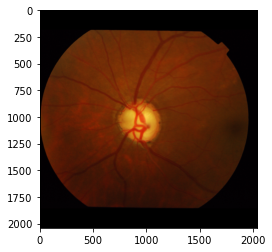

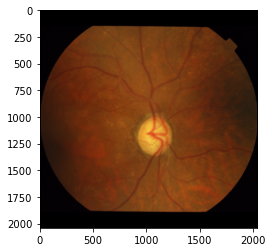

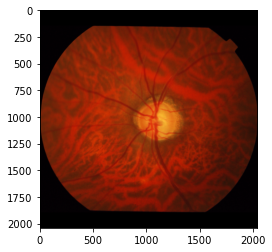

...

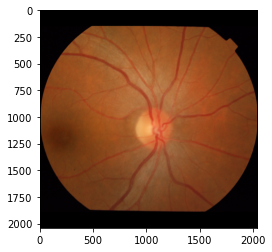

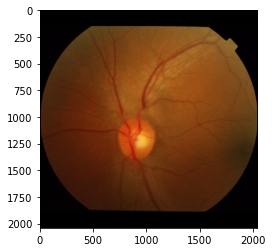

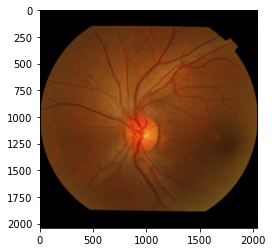

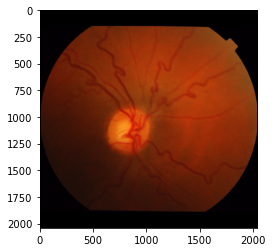

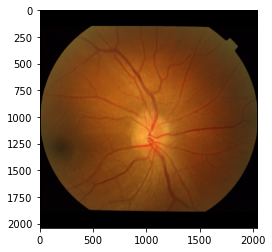

<Figure size 432x288 with 0 Axes>

In [39]:
for i in range(0, len(Xori)):
    plt.imshow(Xori[i])
    plt.figure(i+1)

In [18]:
FC.shape

(50,)

In [19]:
FC

array([b'Training_002', b'Training_004', b'Training_008', b'Training_010',
       b'Training_012', b'Training_015', b'Training_016', b'Training_017',
       b'Training_018', b'Training_022', b'Training_024', b'Training_026',
       b'Training_031', b'Training_032', b'Training_033', b'Training_035',
       b'Training_036', b'Training_037', b'Training_038', b'Training_040',
       b'Training_041', b'Training_042', b'Training_044', b'Training_045',
       b'Training_046', b'Training_047', b'Training_049', b'Training_051',
       b'Training_057', b'Training_058', b'Training_060', b'Training_061',
       b'Training_062', b'Training_063', b'Training_064', b'Training_066',
       b'Training_068', b'Training_069', b'Training_075', b'Training_076',
       b'Training_080', b'Training_081', b'Training_084', b'Training_088',
       b'Training_089', b'Training_090', b'Training_092', b'Training_094',
       b'Training_098', b'Training_101'], dtype=object)

In [20]:
disc_locations

array([[189, 189, 305, 307],
       [248, 187, 373, 306],
       [215, 212, 339, 334],
       [195, 170, 330, 302],
       [234, 211, 359, 328],
       [197, 213, 324, 339],
       [211, 208, 333, 324],
       [191, 148, 317, 269],
       [211, 202, 333, 319],
       [221, 176, 337, 291],
       [194, 173, 339, 302],
       [178, 160, 299, 275],
       [190, 216, 304, 329],
       [186, 153, 347, 292],
       [189, 224, 342, 362],
       [200, 177, 331, 306],
       [214, 176, 356, 313],
       [233, 184, 358, 308],
       [222, 224, 346, 344],
       [168, 169, 305, 293],
       [244, 184, 380, 318],
       [207, 180, 338, 312],
       [207, 192, 335, 316],
       [234, 139, 354, 258],
       [193, 191, 316, 312],
       [255, 229, 375, 348],
       [190, 197, 325, 329],
       [177, 226, 300, 341],
       [237, 208, 358, 322],
       [220, 214, 344, 335],
       [191, 155, 323, 281],
       [193, 194, 311, 310],
       [147, 188, 283, 324],
       [199, 175, 349, 318],
       [201, 1

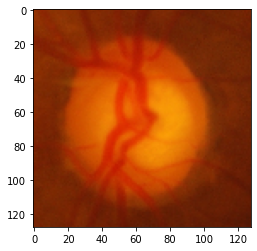

In [22]:
plt.imshow(X_test_dri[1])

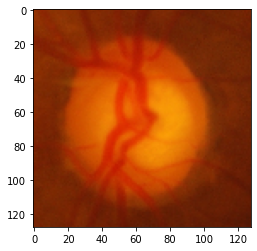

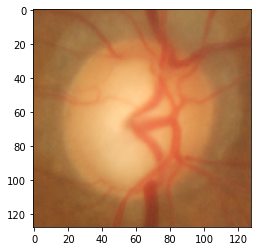

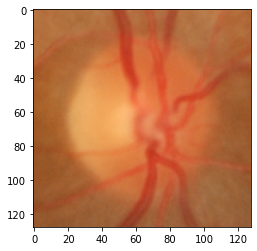

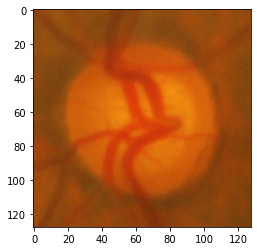

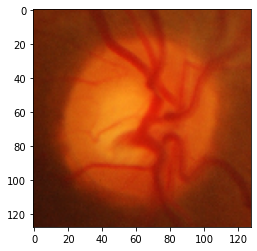

...

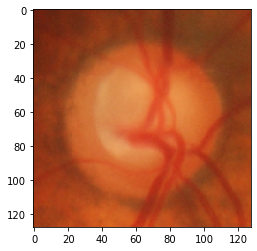

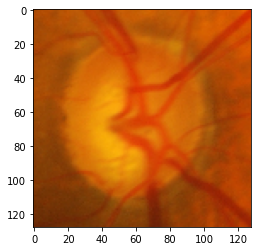

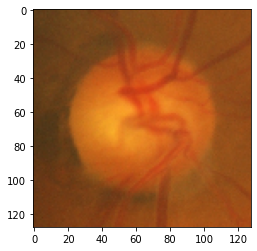

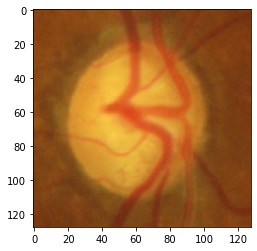

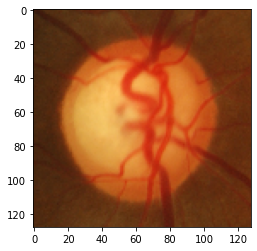

<Figure size 432x288 with 0 Axes>

In [36]:
for i in range(0, len(X_test_dri)):
    plt.imshow(X_test_dri[i])
    plt.figure(i+1)
    
    
    

In [37]:
# step2: Create train and test set by combining datasets

rng = np.random.RandomState(rand_sv)

#DRISHTI
X_train1t, X_test1t, Y_train1t, Y_test1t, F_train1t, F_test1t ,ind_train1, ind_test1= train_test_split( X, Yb, FC, indDRI,test_size=0.25,random_state=rng)



X_test_dri=np.copy(X_test1t)
Y_test_dri=np.copy(Y_test1t)
F_test_dri=np.copy(F_test1t)


if(dri or mix):
  X_train1=np.concatenate([X_train1t,X_train1t])
  X_train1=np.concatenate([X_train1,X_train1t])
  X_test1=np.concatenate([X_test1t,X_test1t])
  X_test1=np.concatenate([X_test1,X_test1t])

  Y_train1=np.concatenate([Y_train1t,Y_train1t])
  Y_train1=np.concatenate([Y_train1,Y_train1t])
  Y_test1=np.concatenate([Y_test1t,Y_test1t])
  Y_test1=np.concatenate([Y_test1,Y_test1t])


if(dri):
  X_train1=np.concatenate([X_train1,X_train1])
  Y_train1=np.concatenate([Y_train1,Y_train1])

X_train1=np.asarray(X_train1)
Y_train1=np.asarray(Y_train1)
X_test=np.asarray(X_test1)
Y_test=np.asarray(Y_test1)

X_train=np.copy(X_train1)
Y_train=np.copy(Y_train1)

size=X_train1.shape[0]

X_traine=np.empty((20*size, 128, 128, 3),dtype=np.float32)
Y_traine=np.empty((20*size, 128, 128, 1),dtype=np.float32)

print(X_train1.shape)
print(Y_train1.shape)
print(X_traine.shape)
print(Y_traine.shape)

(111, 128, 128, 3)
(111, 128, 128, 1)
(2220, 128, 128, 3)
(2220, 128, 128, 1)


In [38]:
# Step3: Preprocessing step for Cup Segmentation
# Perform CLAHE on each image

for i in range(16):
  X_traine[i*size:(i+1)*size]=X_train1
  Y_traine[i*size:(i+1)*size]=Y_train1
  
base= 16*size

for j in tqdm_notebook(range(X_train1.shape[0])):
  X_traine[base]=skimage.exposure.equalize_adapthist(X_train1[j], clip_limit=0.04)
  Y_traine[base]=Y_train1[j]
  base+=1
  X_traine[base]=skimage.exposure.equalize_adapthist(X_train1[j], clip_limit=0.02)
  Y_traine[base]=Y_train1[j]
  base+=1
  X_traine[base]=modify_brightness_p(X_train1[j],0.9)
  Y_traine[base]=Y_train1[j]
  base+=1
  X_traine[base]=modify_brightness_p(X_train1[j],1.1)
  Y_traine[base]=Y_train1[j]
  base+=1
  
X_testc=np.copy(X_test)
Y_testc=np.copy(Y_test)

sizev=X_testc.shape[0]

X_teste=np.empty((20*sizev, 128, 128, 3),dtype=np.float32)
Y_teste=np.empty((20*sizev, 128, 128, 1),dtype=np.float32)

for i in range(8):
  X_teste[i*sizev:(i+1)*sizev]=X_testc
  Y_teste[i*sizev:(i+1)*sizev]=Y_testc
  
basev= 8*sizev

for j in tqdm_notebook(range(X_testc.shape[0])):
  X_teste[basev]=skimage.exposure.equalize_adapthist(X_testc[j], clip_limit=0.04)
  Y_teste[basev]=Y_testc[j]
  basev+=1
  X_teste[basev]=skimage.exposure.equalize_adapthist(X_testc[j], clip_limit=0.02)
  Y_teste[basev]=Y_testc[j]
  basev+=1
  X_teste[basev]=modify_brightness_p(X_testc[j],0.9)
  Y_teste[basev]=Y_testc[j]
  basev+=1
  X_teste[basev]=modify_brightness_p(X_testc[j],1.1)
  Y_teste[basev]=Y_testc[j]
  basev+=1

  0%|          | 0/111 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

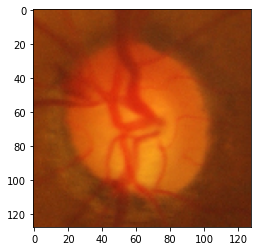

In [29]:
plt.imshow(X_train1[3])

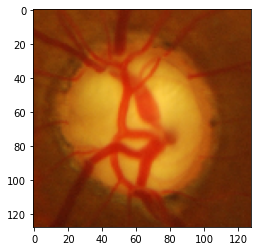

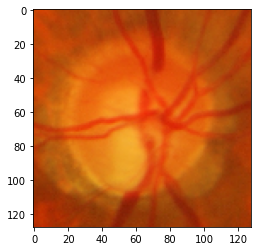

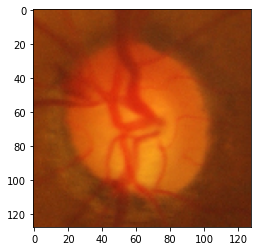

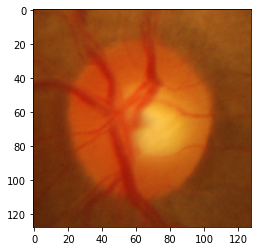

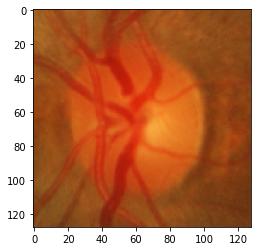

...

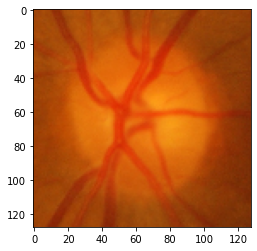

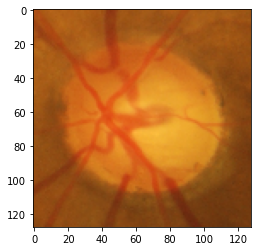

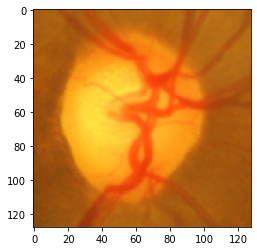

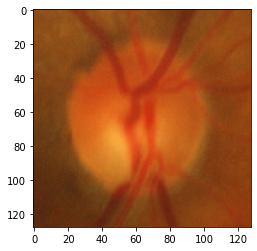

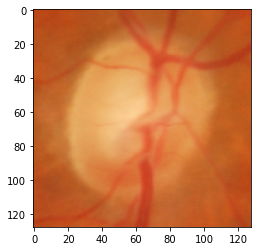

<Figure size 432x288 with 0 Axes>

In [40]:
for i in range(0, len(X_train1)):
    plt.imshow(X_train1[i])
    plt.figure(i+1)

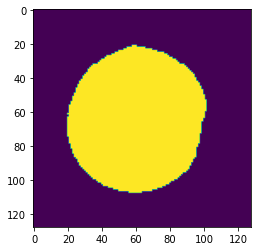

In [30]:
plt.imshow(Y_teste[2])

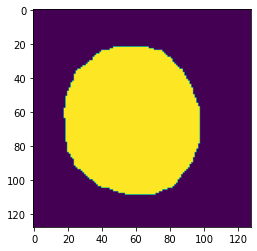

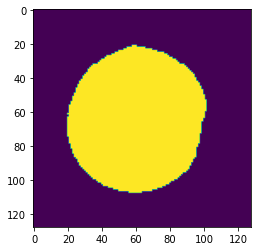

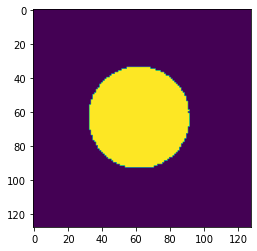

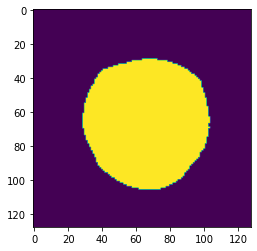

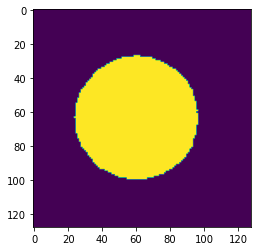

...

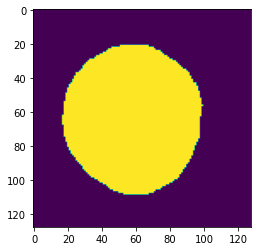

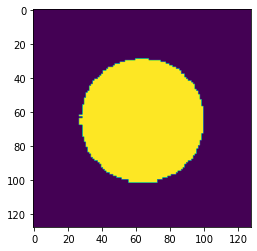

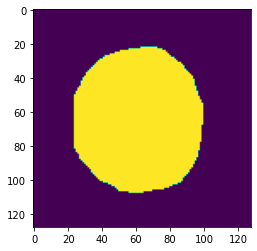

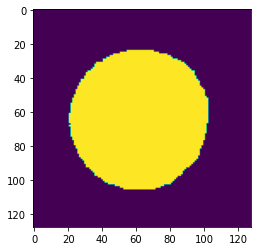

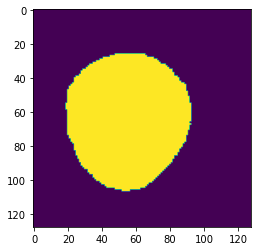

<Figure size 432x288 with 0 Axes>

In [43]:
for i in range(0, 14):
    plt.imshow(Y_teste[i])
    plt.figure(i+1)

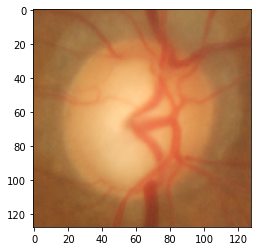

In [44]:
plt.imshow(X_teste[2])

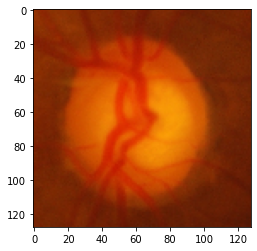

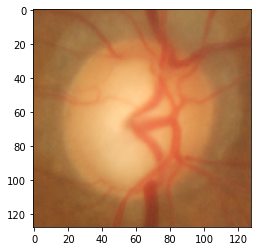

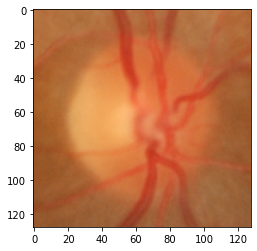

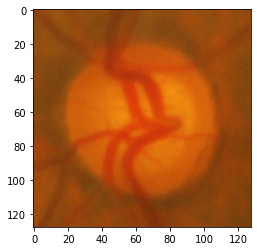

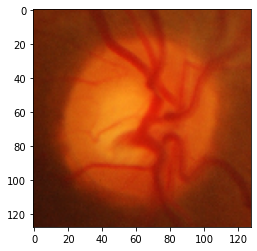

...

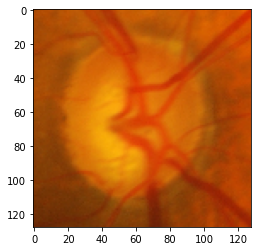

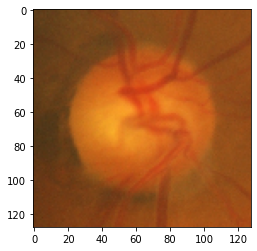

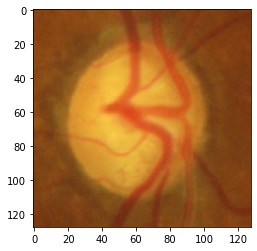

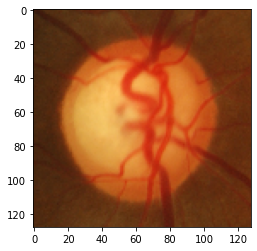

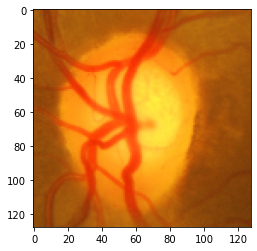

<Figure size 432x288 with 0 Axes>

In [47]:
for i in range(0, 14):
    plt.imshow(X_teste[i])
    plt.figure(i+1)

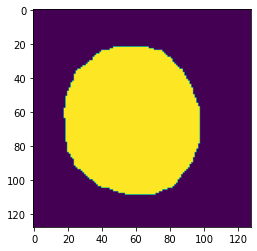

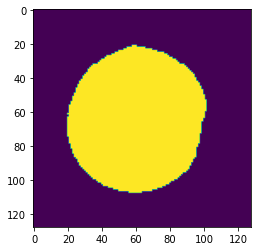

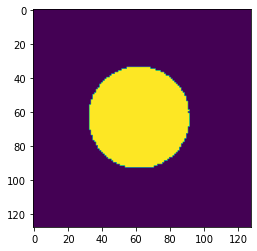

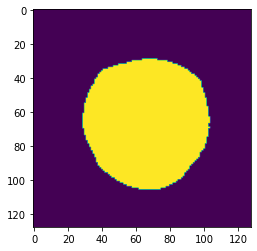

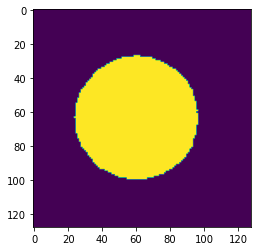

...

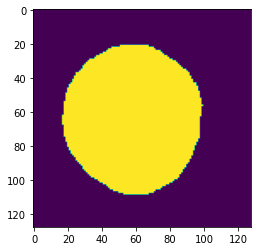

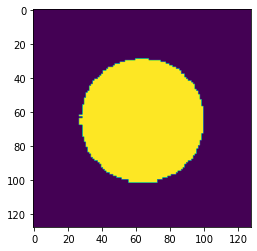

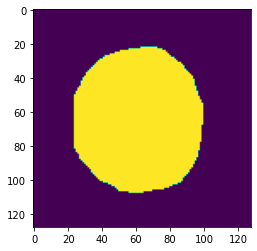

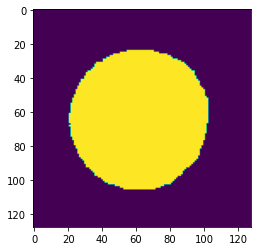

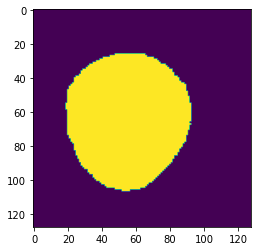

<Figure size 432x288 with 0 Axes>

In [48]:
for i in range(0, 14):
    plt.imshow(Y_testc[i])
    plt.figure(i+1)

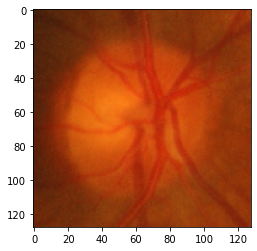

In [49]:
plt.imshow(X_train[0])

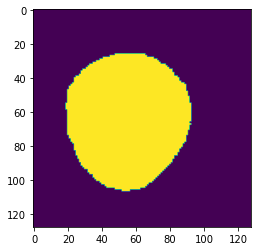

In [50]:
plt.imshow(Y_test_dri[0])

In [15]:
# step4: Shuffle the dataset

X_trains,Y_trains = unison_shuffled_copies(X_traine, Y_traine)
X_tests,Y_tests = unison_shuffled_copies(X_teste, Y_teste)

In [16]:
# Provide the same seed and keyword arguments to the fit and flow methods

seed = rand_sv
batch_s = 120

In [17]:
# helper function for ipython notebook

cp_callbacks = tf.keras.callbacks.ModelCheckpoint(filepath=os.path.join(r'C:\Users\Ranjith ch\Desktop\code\glucoma\last_check_point.hdf5'), verbose=1, save_best_only=True,save_weights_only=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.8, patience=5, min_lr=2e-4)

In [18]:
img_shape

(128, 128, 3)

In [1]:
model = UNet(img_shape,weights="imagenet",dropout=0.5, depth=depth,inc_rate=ir, batchnorm=True)
model.compile(
      optimizer=tf.keras.optimizers.Adam(learning_rate=.001, ),
      loss=log_dice_loss, metrics=[dice_coef]
      )

NameError: name 'UNet' is not defined

In [20]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 128, 128, 64  256        ['conv2d[0][0]']                 
 alization)                     )                                                             

In [21]:
X_tests.shape

(780, 128, 128, 3)

In [22]:
# Model Training Step 

if(train):
    history = model.fit(
    X_trains,Y_trains,
    epochs=20,
    batch_size=128,
    steps_per_epoch=35,
    validation_data = (X_tests,Y_tests),
    callbacks=[cp_callbacks,reduce_lr],
    verbose=1
  )

# save the trained model weights
model.save_weights(os.path.join(r'C:\Users\Ranjith ch\Desktop\code\glucoma\model1_cup_last_check_point.hdf5'), overwrite=True)

Epoch 1/20
35/35 [==============================] - ETA: 0s - loss: 0.1702 - dice_coef: 0.8557 
Epoch 00001: val_loss improved from inf to 2.73159, saving model to C:\Users\Ranjith ch\Desktop\code\glucoma\last_check_point.hdf5
35/35 [==============================] - 1256s 35s/step - loss: 0.1702 - dice_coef: 0.8557 - val_loss: 2.7316 - val_dice_coef: 0.0652 - lr: 0.0010
Epoch 2/20
35/35 [==============================] - ETA: 0s - loss: 0.0401 - dice_coef: 0.9606 
Epoch 00002: val_loss improved from 2.73159 to 1.70669, saving model to C:\Users\Ranjith ch\Desktop\code\glucoma\last_check_point.hdf5
35/35 [==============================] - 1269s 37s/step - loss: 0.0401 - dice_coef: 0.9606 - val_loss: 1.7067 - val_dice_coef: 0.1808 - lr: 0.0010
Epoch 3/20
35/35 [==============================] - ETA: 0s - loss: 0.0280 - dice_coef: 0.9725 
Epoch 00003: val_loss improved from 1.70669 to 0.59994, saving model to C:\Users\Ranjith ch\Desktop\code\glucoma\last_check_point.hdf5
35/35 [==========

In [23]:
# Load the pre trained model's weights

if(train):
  model.load_weights(os.path.join(r'C:\Users\Ranjith ch\Desktop\code\glucoma\model1_cup_last_check_point.hdf5'))

In [24]:
result = model.evaluate(X_tests[0:700,:,:,:],Y_tests[0:700,:,:,:])
print("log dice loss for test set = ", result[0], ' ||| ',"dice coeffecient (accuracy) for test set = ", result[1])

22/22 [==============================] - 29s 1s/step - loss: 0.1967 - dice_coef: 0.8216
log dice loss for test set =  0.19665922224521637  |||  dice coeffecient (accuracy) for test set =  0.8216306567192078


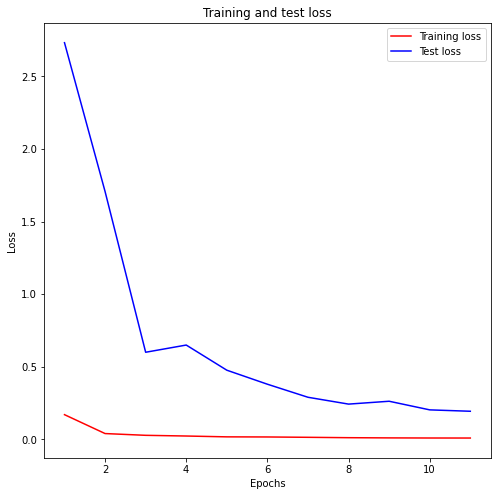

In [25]:

if(train):
  loss = history.history['loss']
  val_loss=history.history['val_loss']
  acc=history.history['dice_coef']
  epochs = range(1, len(loss) + 1)
  plt.figure(figsize=(8, 8))
  plt.plot(epochs, loss, 'r', label='Training loss')
  plt.plot(epochs, val_loss, 'b', label='Test loss')
  plt.title('Training and test loss')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.savefig(os.path.join(r'C:\Users\Ranjith ch\Desktop\code\glucoma','loss'+'model1_cup'+'.png'),dpi=600)

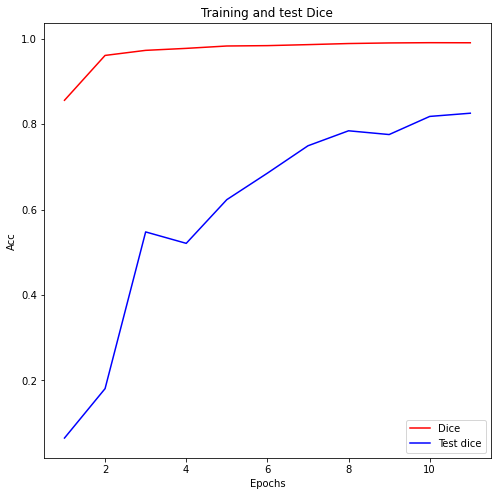

In [26]:
# plot train and test dice coeffecient (accuracy)
if(train):
  loss = history.history['loss']
  acc=history.history['dice_coef']
  val_acc=history.history['val_dice_coef']
  epochs = range(1, len(acc) + 1)
  plt.figure(figsize=(8, 8))
  plt.plot(epochs, acc, 'r', label='Dice')
  plt.plot(epochs, val_acc, 'b', label='Test dice')
  plt.title('Training and test Dice')
  plt.xlabel('Epochs')
  plt.ylabel('Acc')
  plt.legend()
  plt.savefig(os.path.join(r'C:\Users\Ranjith ch\Desktop\code\glucoma','hist'+'model1_cup'+'.png'),dpi=600)

In [28]:
# Defining metrics again

smooth=1e-07
def np_dice_coef(y_true, y_pred):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    return ( (2. * intersection + smooth) / 
             (np.sum(y_true_f) + np.sum(y_pred_f) + smooth) )
    
def np_iou(y_true, y_pred):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    return ( ( intersection + smooth) / 
             (np.sum(y_true_f) + np.sum(y_pred_f) - intersection + smooth) )   

In [29]:
from skimage.morphology import dilation
from skimage.feature import canny
from skimage import color

### Visualise our segmentation algorithm performs on DRISHTI dataset

In [30]:
test_s=int(X_test_dri.shape[0])
test_s

13

(13, 128, 128, 3)


  0%|          | 0/13 [00:00<?, ?it/s]

Dice mean= 0.85196936  Std= 0.062395785  best= 0.9366599  worst= 0.733978
IOU mean= 0.74719167  Std= 0.09354369  best= 0.88086575  worst= 0.5797513
image #2
0.9366599
image #9
0.733978


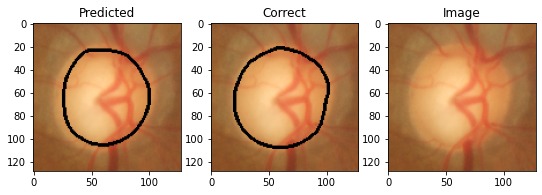

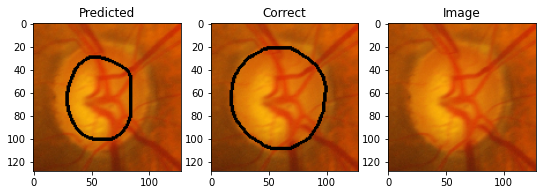

In [32]:
#%%time
pred_dice=np.empty((test_s), dtype=np.float32)
pred_iou=np.empty((test_s), dtype=np.float32)

batch_X = X_test_dri[0:test_s]
batch_y = Y_test_dri[0:test_s]
print (batch_X.shape)
    
predv = (model.predict(batch_X,batch_size=test_s)[...,0]>0.5).astype(np.float32)
corrv= (batch_y)[ ..., 0].astype(np.float32)
predv1=predv.copy()

for i in tqdm_notebook(range(predv.shape[0])):
    img = X_test_dri[i]
    pred = predv[i]
    corr = corrv[i]
    label_pc = skimage.measure.label(pred, connectivity=pred.ndim)
    props_pc = skimage.measure.regionprops(label_pc)
    sz=len(props_pc)
    if(sz)!=0:
      areap=[props_pc[i].area for i in range(sz)]
      k=np.argmax(areap)
      predv1[i]=np.equal(label_pc,k+1).astype(int).astype(np.float32)
    pred1= predv1[i]
    cur_dice = np_dice_coef(pred1, corr)
    cur_iou = np_iou(pred1,corr)
    pred_dice[i]=(cur_dice)
    pred_iou[i]=cur_iou
    
    
d_worst=np.amin(pred_dice)
d_best=np.amax(pred_dice)
d_mean=np.mean(pred_dice)
d_std=np.std(pred_dice)
print("Dice mean=",d_mean, " Std=",d_std, " best=",d_best," worst=",d_worst)

i_worst=np.amin(pred_iou)
i_best=np.amax(pred_iou)
i_mean=np.mean(pred_iou)
i_std=np.std(pred_iou)
print("IOU mean=",i_mean, " Std=",i_std, " best=",i_best," worst=",i_worst)

ix_best=np.argmax(pred_dice)
ix_worst=np.argmin(pred_dice)

j=0
for i in [ix_best,ix_worst]:
    print('image #{}'.format(i))
    img = X_test_dri[i]
    pred = predv1[i]
    corr = corrv[i]
    print(pred_dice[i])
    fig = plt.figure(figsize=(9, 4))
    ax = fig.add_subplot(1, 3, 1)
    edgesp = canny(pred)
    edgesp=1.0-dilation(edgesp)
    edgesp = color.gray2rgb(1.0*edgesp)
    ax.imshow(img*edgesp)
    ax.set_title('Predicted')
    ax = fig.add_subplot(1, 3, 2)
    edgesc = canny(corr)
    edgesc=1.0-dilation(edgesc)
    edgesc = color.gray2rgb(1.0*edgesc)
    ax.imshow(img*edgesc)
    ax.set_title('Correct')
    ax = fig.add_subplot(1, 3, 3)
    ax.imshow(img)
    ax.set_title('Image')
    fig.savefig(os.path.join(r'C:\Users\Ranjith ch\Desktop\code\glucoma','img_drishti'+str(j)+'model1_cup'+'.png'),dpi=600)
    j+=1